In [306]:
#!/anaconda2/bin/python

# -*- coding: utf-8 -*-

import sys
print sys.getdefaultencoding()

ascii


## Import dependencies 

In [307]:
%matplotlib inline

# pandas for data manipulation
import pandas as pd
pd.options.mode.chained_assignment = None
from pandas.io.json import json_normalize

# nltk for nlp
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords

# list of stopwords
stop = set(stopwords.words('english'))
from string import punctuation
from collections import Counter
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn; seaborn.set()
import datetime 
import datetime as dt
import json
import gzip

In [308]:
# html code to display tables side by side 
from IPython.display import display_html
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

## Reading the data

In [309]:
with open('signalmedia-1m.jsonl') as fp:
    volkswagen_articles = []
    articles = []
    for line in fp:
        news_article = json.loads(line)
        if 'Volkswagen' in news_article['content'] and ('emissions' in news_article['content'] or 'scandal' in news_article['content']):
        	volkswagen_articles.append(news_article)


In [310]:
data = pd.DataFrame(volkswagen_articles)
data.head()


,content,id,media-type,published,source,title
0,The fuel economy and smog ratings are shown on...,d86e447d-da83-4cc3-80b1-6dc3b561ee8f,News,2015-09-22T00:38:00Z,Malay Mail,Criminal probe: Volkswagen slams into huge fal...
1,European stock markets recovered their poise T...,4f802018-0e59-4e94-a45f-bd2858d71049,News,2015-09-29T13:48:07Z,Wichita Eagle,US stocks are stable in early trade; energy se...
2,Dear Volkswagen: \n\nI want my money back. \n ...,a3ab3e80-2a05-4256-aa44-3a6ba8e3f66a,News,2015-09-24T19:15:00Z,Chicago Tribune,Volkswagen's Whizzinator moment
3,FRANKFURT: Heads are certain to roll at Volksw...,b6915385-8da6-415b-9f5d-046147a3e231,News,2015-09-22T05:47:46Z,Economic Times,Volkswagen scandal will have personnel consequ...
4,The smogging scandal that has enveloped Volksw...,df17b310-a48e-40b0-869b-276f235cf06a,Blog,2015-09-25T22:06:40Z,The Very Cool Stuff,The EPA is cracking down hard on auto industry...


In [311]:
data.keys()

Index([u'content', u'id', u'media-type', u'published', u'source', u'title'], dtype='object')

## Data Analysis 
### Data Discovery

In [312]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3829 entries, 0 to 3828
Data columns (total 6 columns):
content       3829 non-null object
id            3829 non-null object
media-type    3829 non-null object
published     3829 non-null object
source        3829 non-null object
title         3829 non-null object
dtypes: object(6)
memory usage: 179.6+ KB


In [313]:
print('data shape:', data.shape)

('data shape:', (3829, 6))


Let's check the distribution of the different media type across the dataset.



[Text(0,0.5,'number of articles'), Text(0.5,0,'media type')]

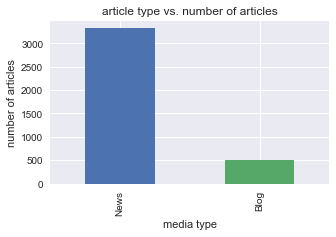

In [314]:
mx1 = data['media-type'].value_counts().plot(kind='bar', grid=True, figsize=(5, 3),title = "article type vs. number of articles")
mx1.set(xlabel = 'media type',ylabel='number of articles')

### Top 20 newspapers that published about the topic

('number of unique news papers that published about the topic', 1573)
top 20 newspapers that published aout the topic


[Text(0,0.5,'number of articles'), Text(0.5,0,'newpaper name')]

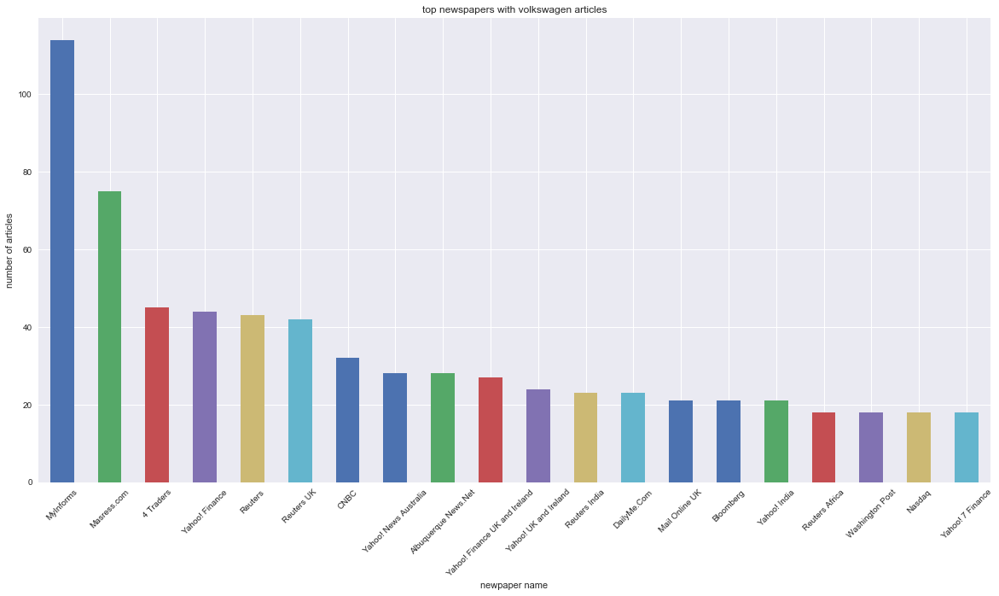

In [315]:
print('number of unique news papers that published about the topic', data.source.nunique())
print('top 20 newspapers that published aout the topic')
data['source'].value_counts()[:20]
mx2 = data['source'].value_counts()[:20].plot(kind='bar', grid=True, figsize=(20, 10),rot=45, title="top newspapers with volkswagen articles")
mx2.set(xlabel = 'newpaper name',ylabel='number of articles')

In [316]:
# checking missing values 
data.isnull().sum()

content       0
id            0
media-type    0
published     0
source        0
title         0
dtype: int64

In [317]:
# remove duplicate content columns
data = data.drop_duplicates('content')

# remove rows with empty contnet
data = data[~data['content'].isnull()]
print('shape of the data is ',data.shape)

# add a new column with the length of the content
data['len_content'] = data['content'].map(len)

# only keep content that longer than 200
data = data[data.len_content > 200]
#data.reset_index(inplace=True)
#data.drop('index', inplace=True, axis=1)
print('shape of the data after removing duplication is ',data.shape)
print('number of non duplicated rows',len(data.groupby('id').nunique()))
data.head(3)

('shape of the data is ', (3335, 6))
('shape of the data after removing duplication is ', (3291, 7))
('number of non duplicated rows', 3291)


,content,id,media-type,published,source,title,len_content
0,The fuel economy and smog ratings are shown on...,d86e447d-da83-4cc3-80b1-6dc3b561ee8f,News,2015-09-22T00:38:00Z,Malay Mail,Criminal probe: Volkswagen slams into huge fal...,5590
1,European stock markets recovered their poise T...,4f802018-0e59-4e94-a45f-bd2858d71049,News,2015-09-29T13:48:07Z,Wichita Eagle,US stocks are stable in early trade; energy se...,2701
2,Dear Volkswagen: \n\nI want my money back. \n ...,a3ab3e80-2a05-4256-aa44-3a6ba8e3f66a,News,2015-09-24T19:15:00Z,Chicago Tribune,Volkswagen's Whizzinator moment,3379


## Text processing 
### Cleaning 

In [318]:
def pre_process(text):
    text = text.replace('-\n', '').replace('- \n', ' ').replace('\n', ' ').replace('\t', ' ')
    return text.lower()

data['title'] = data['title'].map(pre_process)
data['content'] =  data['content'].map(pre_process)

# print only the first 500 charchters of the second content 
data.content[2][:500]

u'dear volkswagen:   i want my money back.    two years ago, when i went shopping for a new car for the first time in 10 years, i ended up buying one of yours: a 2014 passat tdi.   part of your clean diesel lineup, the sales manager told me, it was a car that would allow me to be environmentally responsible while enjoying superior fuel economy.    i actually thought she was serious.   now i know better.   turns out the impressive emissions numbers you touted in your ads and showrooms were fraudule'

### Tokenization
The `tokenizer` function will process the `content` and the `title`:
* remove unwanted tokens such as `\n` 
* break the descriptions into sentences and then break the sentences into tokens
* remove punctuation and stop words
* remove numbers
* lowercase the tokens

In [319]:
def tokenizer(text):
    try:
        text = text.replace('-\n', '').replace('- \n', ' ').replace('\n', ' ').replace('\t', ' ')
        sents = sent_tokenize(text)
        tokens_ = [word_tokenize(sent) for sent in sents]

        tokens = []
        for token_by_sent in tokens_:
            tokens += token_by_sent

        tokens = list(filter(lambda t: t.lower() not in stop, tokens))
        tokens = list(filter(lambda t: t not in punctuation, tokens))
        tokens = list(filter(lambda t: t not in [u"'s", u"n't", u"...", u"''", u'``', 
                                                 u'\u2014', u'\u2026', u'\u2013'], tokens))
        
        filtered_tokens = []
        for token in tokens:
            if re.search('[a-zA-Z]', token):
                filtered_tokens.append(token)

        filtered_tokens = list(map(lambda token: token.lower(), filtered_tokens))

        return filtered_tokens
    except Error as e:
        print(e)



We apply the `tokenizer` function to the content and the title fields. 

In [320]:
# apply tokenizer to content and create a new column for content tokens
data['tokens'] = data['content'].map(tokenizer)

# apply tokenizer to title and create a new column for title tokens
data['tokens_title'] =  data['title'].map(tokenizer)
data['content'][1][:500]

u"european stock markets recovered their poise tuesday despite an earlier rout in asia which featured a 4 percent slide in japan's main index.   keeping score: in europe, germany's dax rose 0.2 percent to 9,504 while the cac-40 in france was steady at 4,357. the ftse 100 index of leading british shares underperformed its main european counterparts, trading 0.5 percent lower at 5,929. u.s. stocks were poised for a solid opening with dow futures and the broader s&p 500 futures up 0.5 percent.   sour"

In [321]:
# print the result of tokenization or the first 1 contents:
for content, tokens in zip(data['content'].head(1), data['tokens'].head(1)):
    print('content:', content[:500])
    print('tokens:', tokens[:20])
    print() 

('content:', u'the fuel economy and smog ratings are shown on the sticker price of a 2015 passat limited edition vehicle at a volkswagen dealership in escondido, california, september 21, 2015. \u2014\xa0reuters pic frankfurt, sept 22 \u2014 german auto giant volkswagen\u2019s shares plummeted nearly 20 per cent yesterday as investigations spread into revelations\xa0that hundreds of thousands of its diesel cars have software that secretly thwarts us pollution tests.    volkswagen, the world\u2019s largest automaker by sales in the firs')
('tokens:', [u'fuel', u'economy', u'smog', u'ratings', u'shown', u'sticker', u'price', u'passat', u'limited', u'edition', u'vehicle', u'volkswagen', u'dealership', u'escondido', u'california', u'september', u'reuters', u'pic', u'frankfurt', u'sept'])
()


### Processing timestamp 
The `published` column contains timestamp and the time needed to be formated 

In [322]:
# update the published column and spread it into timestamp and dates
data['timestamp'] = data['published'].apply(lambda x : pd.to_datetime(str(x)))
#del reg['published']

data['dates'] = data['timestamp'].dt.date
data['timestamp'] = data['timestamp'].apply(lambda x : pd.to_datetime(str(x)))

# extract year and month
#data['year'] = pd.DatetimeIndex(data['published']).year
#data['month'] = pd.DatetimeIndex(data['published']).month

data.head()

,content,id,media-type,published,source,title,len_content,tokens,tokens_title,timestamp,dates
0,the fuel economy and smog ratings are shown on...,d86e447d-da83-4cc3-80b1-6dc3b561ee8f,News,2015-09-22T00:38:00Z,Malay Mail,criminal probe: volkswagen slams into huge fal...,5590,"[fuel, economy, smog, ratings, shown, sticker,...","[criminal, probe, volkswagen, slams, huge, fal...",2015-09-22 00:38:00,2015-09-22
1,european stock markets recovered their poise t...,4f802018-0e59-4e94-a45f-bd2858d71049,News,2015-09-29T13:48:07Z,Wichita Eagle,us stocks are stable in early trade; energy se...,2701,"[european, stock, markets, recovered, poise, t...","[us, stocks, stable, early, trade, energy, sec...",2015-09-29 13:48:07,2015-09-29
2,dear volkswagen: i want my money back. tw...,a3ab3e80-2a05-4256-aa44-3a6ba8e3f66a,News,2015-09-24T19:15:00Z,Chicago Tribune,volkswagen's whizzinator moment,3379,"[dear, volkswagen, want, money, back, two, yea...","[volkswagen, whizzinator, moment]",2015-09-24 19:15:00,2015-09-24
3,frankfurt: heads are certain to roll at volksw...,b6915385-8da6-415b-9f5d-046147a3e231,News,2015-09-22T05:47:46Z,Economic Times,volkswagen scandal will have personnel consequ...,880,"[frankfurt, heads, certain, roll, volkswagen, ...","[volkswagen, scandal, personnel, consequences,...",2015-09-22 05:47:46,2015-09-22
4,the smogging scandal that has enveloped volksw...,df17b310-a48e-40b0-869b-276f235cf06a,Blog,2015-09-25T22:06:40Z,The Very Cool Stuff,the epa is cracking down hard on auto industry...,273,"[smogging, scandal, enveloped, volkswagen, als...","[epa, cracking, hard, auto, industry, shenanig...",2015-09-25 22:06:40,2015-09-25


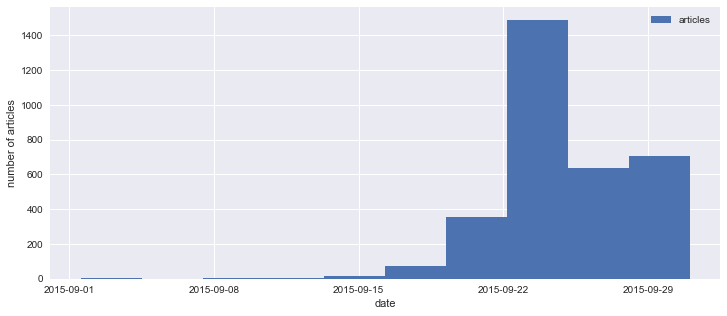

In [323]:
# timeline distribution of the data 
ax0 = data['timestamp'].hist(figsize=(12,5))
ax0.set(xlabel = 'date',ylabel='number of articles')
ax0.legend(["articles"])

From the bar chart above all the articles were written in september 2015

### Who broke news about the scandal 

In [324]:
oldest_article = data['timestamp'].min()

# Select the article with the earliest published date
first_newspaper = data[(data['timestamp'] == oldest_article)]
print('The newspaper which broke the story is: ',first_newspaper['source'])

latest_date = data['timestamp'].max()

('The newspaper which broke the story is: ', 2995    Good Day Sacramento
Name: source, dtype: object)


### Which date has the highest number of published articles?

[Text(0,0.5,'number of articles'), Text(0.5,0,'date')]

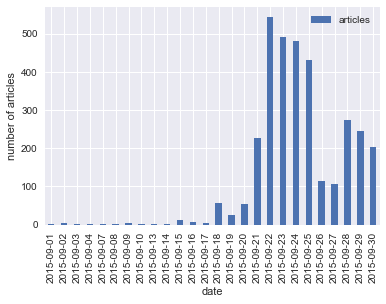

In [325]:
data["newdate"] = data["dates"].astype("datetime64")
#ax22 = data.timestamp.resample('D').count().plot();
ax22= data.groupby(data["newdate"].dt.date).agg({'id':'count'}).plot(kind="bar")
#lines, labels = ax22.get_legend_handles_labels()
ax22.legend(["articles"])
ax22.set(xlabel = 'date',ylabel='number of articles')



### When was the highest number of released publications on the topic

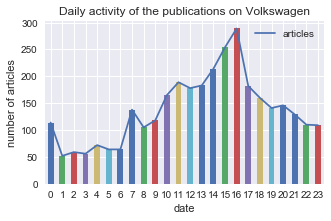

In [326]:
s = data['id'].groupby([data['timestamp'].dt.hour]).count() #data.groupby(data["newdate"].dt.hour).agg({'id':'count'})
ax = s.plot(kind="bar",legend = False, title = "When was the highest number of published articles (hour)")
ax.set(xlabel = 'hour',ylabel='number of articles')
ax.legend(bbox_to_anchor=(1,1)) 
ax.legend(["articles"]);

daily_line_graph = data['id'].groupby(data.timestamp.dt.hour).count().plot(figsize=(5, 3), title = "Daily activity of the publications on Volkswagen",)
daily_line_graph.set(xlabel = 'date',ylabel='number of articles')
daily_line_graph.legend(["articles"])



### The newspapers that published about Volkswagen

In [327]:
counts = pd.value_counts(data['source'])
counts.keys()
counts.sort_index()[:5]


1010 WCSI           2
104.7 Minster FM    1
1070wapi.com        1
12 News Now         1
1440 WNFL           2
Name: source, dtype: int64

## Word Count and tf-idf
Apply a word count and display the top 10 most frequent tokens in two categories of media types blogs and news 


In [328]:
def keywords(media_type):
    tokens = data[data['media-type'] == media_type]['tokens']
    alltokens = []
    for token_list in tokens:
        alltokens += token_list
    counter = Counter(alltokens)
    return counter.most_common(10)

for media_type in set(data['media-type']):
    print('media type :', media_type)
    print('top 10 keywords:', keywords(media_type))
    print('---')

('media type :', u'Blog')
('top 10 keywords:', [(u'volkswagen', 2146), (u'emissions', 1372), (u'vw', 1362), (u'cars', 1225), (u'diesel', 1107), (u'said', 1074), (u'new', 966), (u'car', 785), (u'company', 726), (u'vehicles', 698)])
---
('media type :', u'News')
('top 10 keywords:', [(u'volkswagen', 12515), (u'said', 10415), (u'vw', 7462), (u'emissions', 7241), (u'cars', 7090), (u'diesel', 6078), (u'company', 5258), (u'vehicles', 4503), (u'u.s.', 4354), (u'scandal', 4241)])
---


Looking at these list of frequent words in two media typesl, blogs and news. The 10 most frequent words confirmed our intitial conditions on extracting Volkswagen articles as words like `vehicles`,`volkswagen`, `emissions` and `scandal` are the most frequent in both categories. 

As a first approach to filter the most frequent words that does not carry a meaning is to use `tf-idf`. I will use the scikit-learn libarary's method TfidfVectorizer to compute the tfidf matrix.


In [329]:
from sklearn.feature_extraction.text import TfidfVectorizer

# min_df is minimum number of documents that contain a term t
# max_features is maximum number of unique tokens (across documents) that we'd consider
# TfidfVectorizer preprocesses the content using the tokenizer  defined above

vectorizer = TfidfVectorizer(min_df=10, max_features=10000, tokenizer=tokenizer, ngram_range=(1, 2))
vz = vectorizer.fit_transform(list(data['content']))

In [330]:
vz.shape

(3291, 10000)

The shpae of the matrix `vz` defines as (total number of contents, total number of unique tokens across documents). 

In [331]:
# tfidf dictionary maps the tokens to their tfidf values
tfidf = dict(zip(vectorizer.get_feature_names(), vectorizer.idf_))
tfidf = pd.DataFrame(columns=['tfidf']).from_dict(dict(tfidf), orient='index')
tfidf.columns = ['tfidf']


#### Visualization of the distribution of the tfidf scores 

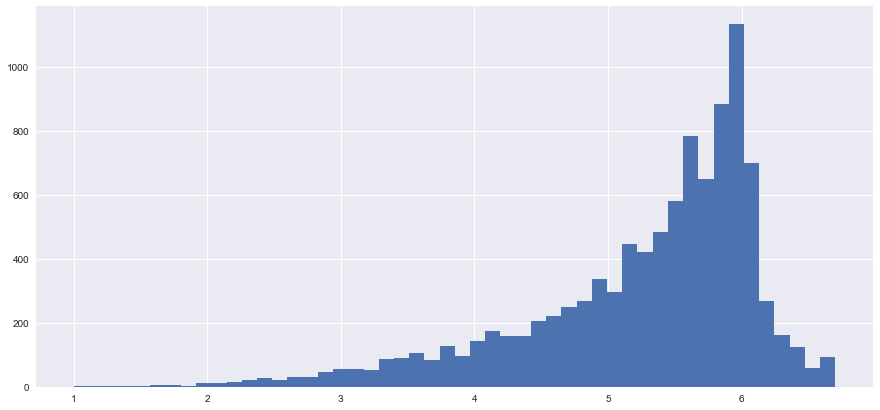

In [332]:
tfidf.tfidf.hist(bins=50, figsize=(15,7))

In [333]:
#Let's display the 30 tokens that have the lowest and the highest tfidf scores
print('Lowest tfidf scores, highest tfidf scores')
display_side_by_side(tfidf.sort_values(by=['tfidf'], ascending=True).head(14),tfidf.sort_values(by=['tfidf'], ascending=False).head(14))

Lowest tfidf scores, highest tfidf scores


,tfidf
volkswagen,1.005177
emissions,1.133011
said,1.313945
diesel,1.354248
scandal,1.366443
cars,1.398955
company,1.497848
tests,1.551222
vw,1.569844
vehicles,1.596512


The the lowest scores list contains most common words across the articles' content such as  the words that we use to filter the dataset (`volkswagen`, `emissions` and `scandal`). The tfidf attributes a low score to them as they are common.

The list with highest tfidf score has less common words. These words are relevant to the outline the underlying topic such as `nhtsa`-National Highway Traffic Safety Administration,`albuquerque`- USA city that popular for Volkswagen cars. 

The dimensionality of tfidf matrix is very larage with max feature of 10000 (number of columns for vz.shape). In order to preceed with the analysis, we will apply dimensionality reduction. Two techniques will be applied Singular Value Decomposition (SVD) to reduce the dimension to 50 and then t-SNE to reduce the dimension from 50 to 2. 

In [334]:
# 1. Applying SVD to turn the dimensionality to 50 
from sklearn.decomposition import TruncatedSVD
svd = TruncatedSVD(n_components=50, random_state=0)
svd_tfidf = svd.fit_transform(vz)
print('dim after svd:',svd_tfidf.shape)
# 2. Applying tsne to reduce dimensionality to 2
from sklearn.manifold import TSNE

tsne_model = TSNE(n_components=2, verbose=1, random_state=0)
tsne_tfidf = tsne_model.fit_transform(svd_tfidf)
print('dim after tsne:',tsne_tfidf.shape)

('dim after svd:', (3291, 50))
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3291 samples in 0.005s...
[t-SNE] Computed neighbors for 3291 samples in 1.061s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3291
[t-SNE] Computed conditional probabilities for sample 2000 / 3291
[t-SNE] Computed conditional probabilities for sample 3000 / 3291
[t-SNE] Computed conditional probabilities for sample 3291 / 3291
[t-SNE] Mean sigma: 0.128126
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.683540
[t-SNE] Error after 1000 iterations: 1.112700
('dim after tsne:', (3291, 2))


### Visualizing the data. 
Having reduced the deminsionality of the articles' content to 2 dim, we will visualize theese articles using scatter plot of matplotlib. However the plot will be busy and as such we will add interaction to the graph using Bokeh library.



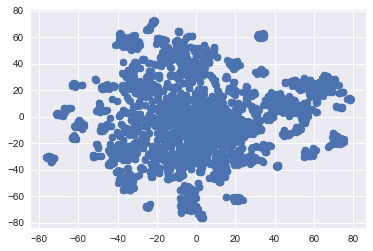

In [335]:
plt.scatter(tsne_tfidf[:,0],tsne_tfidf[:,1])

In [336]:
import bokeh.plotting as bp
from bokeh.models import HoverTool, BoxSelectTool
from bokeh.plotting import figure, show, output_notebook
output_notebook()
plot_tfidf = bp.figure(plot_width=700, plot_height=600, title="tf-idf clustering of the news",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)
tfidf_df = pd.DataFrame(tsne_tfidf, columns=['x', 'y'])
tfidf_df[tfidf_df.index.duplicated()]


tfidf_df['title'] = data['title'].values
tfidf_df['media-type'] = data['media-type'].values
tfidf_df = tfidf_df.rename(columns = {'media-type':'mtype'})
plot_tfidf.scatter(x='x', y='y', source=tfidf_df)
hover = plot_tfidf.select(dict(type=HoverTool))
hover.tooltips={"title": "@title", "media-type":"@mtype"}
show(plot_tfidf)

Loading BokehJS ...

## Clustering 
1. Choose the right number of cluster. A good rule is using the elbow of the inertia plot, which is the point where the inertia starts to decrease more slowly
2. Apply the clustering algorithem kmeans to cluster the content.

In [337]:
# 1. Inertia plot to determine the number of clusters 
'''
from sklearn.cluster import KMeans 

ks = range(1, 30)
inertias = []

for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters = k)
    
    # Fit model to samples
    model.fit(vz)
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
# Plot ks vs inertias
plt.plot(ks, inertias, '-o')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()
'''

"\nfrom sklearn.cluster import KMeans \n\nks = range(1, 30)\ninertias = []\n\nfor k in ks:\n    # Create a KMeans instance with k clusters: model\n    model = KMeans(n_clusters = k)\n    \n    # Fit model to samples\n    model.fit(vz)\n    \n    # Append the inertia to the list of inertias\n    inertias.append(model.inertia_)\n    \n# Plot ks vs inertias\nplt.plot(ks, inertias, '-o')\nplt.xlabel('number of clusters, k')\nplt.ylabel('inertia')\nplt.xticks(ks)\nplt.show()\n"

The inertia decreases very slowly from 29 clusters to 30, so it looks like 29 clusters would be a good choice for this data.

In [338]:
from sklearn.cluster import MiniBatchKMeans

num_clusters = 29
kmeans_model = MiniBatchKMeans(n_clusters=num_clusters, init='k-means++', n_init=1, 
                         init_size=1000, batch_size=1000, verbose=False, max_iter=1000)
kmeans = kmeans_model.fit(vz)
kmeans_clusters = kmeans.predict(vz)
kmeans_distances = kmeans.transform(vz)

# the clusters of the first 5 articles 
for (i, content),media_type in zip(enumerate(data.content),data['media-type']):
    if(i < 5):
        print("Cluster " + str(kmeans_clusters[i]) + ": " + content[:50] + 
              "(distance: " + str(kmeans_distances[i][kmeans_clusters[i]]) + ")")
        print('media_type: ',media_type)
        print('---')

Cluster 16: the fuel economy and smog ratings are shown on the(distance: 0.8350423385818851)
('media_type: ', u'News')
---
Cluster 11: european stock markets recovered their poise tuesd(distance: 0.8493984818268834)
('media_type: ', u'News')
---
Cluster 10: dear volkswagen:   i want my money back.    two ye(distance: 0.9460572318933728)
('media_type: ', u'News')
---
Cluster 3: frankfurt: heads are certain to roll at volkswagen(distance: 0.9465738430329974)
('media_type: ', u'News')
---
Cluster 23: the smogging scandal that has enveloped volkswagen(distance: 1.0042439350982637)
('media_type: ', u'Blog')
---


In [339]:
## the 5 keywords that describe each cluster 
sorted_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()
for i in range(num_clusters):
    print("Cluster %d:" % i)
    aux = ''
    for j in sorted_centroids[i, :5]:
        aux += terms[j] + ' | '
    print(aux)
    print() 

Cluster 0:
sunday | said | cars | deeply sorry | deeply | 
()
Cluster 1:
said | volkswagen | vw | german | cars | 
()
Cluster 2:
volkswagen | said | emissions | cars | vw | 
()
Cluster 3:
said | volkswagen | u.s. | company | winterkorn | 
()
Cluster 4:
fed | percent | markets | china | fell | 
()
Cluster 5:
pope | climate | francis | read | pope francis | 
()
Cluster 6:
bmw | x3 | icct | bmw x3 | auto bild | 
()
Cluster 7:
llp | class | volkswagen | http | vehicles | 
()
Cluster 8:
winterkorn | fresh start | volkswagen | fresh | said | 
()
Cluster 9:
uk | vehicles | fitted | vw | affected | 
()
Cluster 10:
vw | diesel | cars | volkswagen | emissions | 
()
Cluster 11:
percent | points | index | fell | cent | 
()
Cluster 12:
us | vw | cars | said | uk | 
()
Cluster 13:
china | growth | economy | percent | low | 
()
Cluster 14:
epa | testing | grundler | agency | automakers | 
()
Cluster 15:
q. | a. | u.s. | cars | volkswagen | 
()
Cluster 16:
epa | cars | volkswagen | vw | said | 
()
Clu

### Plot clusters 
1. Reduce the dimensionality of kmeans_distances to 2.
2. Assign color to each cluster 


In [340]:
tsne_kmeans = tsne_model.fit_transform(kmeans_distances)
import numpy as np

colormap = np.array(["#6d8dca", "#69de53", "#723bca", "#c3e14c", "#c84dc9", "#68af4e", "#6e6cd5",
"#e3be38", "#4e2d7c", "#5fdfa8", "#d34690", "#3f6d31", "#d44427", "#7fcdd8", "#cb4053", "#5e9981",
"#803a62", "#9b9e39", "#c88cca", "#e1c37b", "#34223b", "#bdd8a3", "#6e3326", "#cfbdce", "#d07d3c",
"#52697d", "#7d6d33", "#d27c88", "#36422b", "#b68f79"])

plot_kmeans = bp.figure(plot_width=700, plot_height=600, title="KMeans clustering of the news",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)
kmeans_df = pd.DataFrame(tsne_kmeans, columns=['x', 'y'])
kmeans_df['cluster'] = kmeans_clusters
kmeans_df['title'] = data['title'].values
kmeans_df['media-type'] = data['media-type'].values
kmeans_df = kmeans_df.rename(columns = {'media-type':'mtype'})

kmeans_df['colors'] = colormap[kmeans_clusters]
#source = bp.ColumnDataSource(data = kmeans_df) #= dict(x = kmeans_df['x'],y = kmeans_df['y']))
plot_kmeans.scatter(x='x', y='y',color='colors',source= kmeans_df)
hover = plot_kmeans.select(dict(type=HoverTool))
hover.tooltips={"title": "@title", "media-type": "@mtype", "cluster":"@cluster"}
show(plot_kmeans)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3291 samples in 0.006s...
[t-SNE] Computed neighbors for 3291 samples in 0.681s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3291
[t-SNE] Computed conditional probabilities for sample 2000 / 3291
[t-SNE] Computed conditional probabilities for sample 3000 / 3291
[t-SNE] Computed conditional probabilities for sample 3291 / 3291
[t-SNE] Mean sigma: 0.034638
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.286102
[t-SNE] Error after 1000 iterations: 0.971406


### Applying LDA 

In [341]:
import lda
from sklearn.feature_extraction.text import CountVectorizer
import logging
logging.getLogger("lda").setLevel(logging.WARNING)
cvectorizer = CountVectorizer(min_df=4, max_features=10000, tokenizer=tokenizer, ngram_range=(1,2))
cvz = cvectorizer.fit_transform(data['content'])

n_topics = 20
n_iter = 2000
lda_model = lda.LDA(n_topics=n_topics, n_iter=n_iter)
X_topics = lda_model.fit_transform(cvz)
n_top_words = 8
topic_summaries = []

topic_word = lda_model.topic_word_  # get the topic words
vocab = cvectorizer.get_feature_names()
for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    topic_summaries.append(' '.join(topic_words))
    print('Topic {}: {}'.format(i, ' '.join(topic_words)))
tsne_lda = tsne_model.fit_transform(X_topics)
doc_topic = lda_model.doc_topic_
lda_keys = []
for i, tweet in enumerate(data['content']):
    lda_keys += [doc_topic[i].argmax()]
plot_lda = bp.figure(plot_width=700, plot_height=600, title="LDA topic visualization",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)
lda_df = pd.DataFrame(tsne_lda, columns=['x','y'])
lda_df['content'] = data['content'].values
lda_df['media-type'] = data['media-type'].values
lda_df = lda_df.rename(columns = {'media-type':'mtype'})
lda_df['topic'] = lda_keys
lda_df['topic'] = lda_df['topic'].map(int)
lda_df['colors'] = colormap[lda_keys]

plot_lda.scatter( x='x', y='y', color='colors',source=lda_df)

hover = plot_lda.select(dict(type=HoverTool))
hover.tooltips={"content":"@content", "topic":"@topic", "media_type":"@mtype"}
show(plot_lda)

Topic 0: said http financial billion market company economy german
Topic 1: vw said german us volkswagen billion scandal car
Topic 2: volkswagen vehicles class law firm company emissions action
Topic 3: volkswagen said cars vehicles million emissions software affected
Topic 4: car new model electric volkswagen tesla also engine
Topic 5: volkswagen u.s. company said cars emissions german vehicles
Topic 6: volkswagen winterkorn vw company ceo board said scandal
Topic 7: one would like people time years even new
Topic 8: said volkswagen cars emissions epa vw us winterkorn
Topic 9: diesel vw cars volkswagen car said could vehicles
Topic 10: epa emissions volkswagen vw cars software diesel said
Topic 11: said volkswagen software company cars billion vw vehicles
Topic 12: egypt people saudi day egyptian china says u.s.
Topic 13: percent index shares fell per points stocks cent
Topic 14: news september video pm share google read data
Topic 15: said volkswagen u.s. emissions diesel company car

### Visualization of the topics using pyLDAvis¶

In [342]:
import pyLDAvis
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

lda_buffer = data['tokens'].map(len)
lda_df['len_docs'] = lda_buffer.values
def prepareLDAData():
    data = {
        'vocab': vocab,
        'doc_topic_dists': lda_model.doc_topic_,
        'doc_lengths': list(lda_df['len_docs']),
        'term_frequency':cvectorizer.vocabulary_,
        'topic_term_dists': lda_model.components_
    } 
    return data
ldadata = prepareLDAData()
pyLDAvis.enable_notebook()
prepared_data = pyLDAvis.prepare(**ldadata)
pyLDAvis.save_html(prepared_data,'./pyldadavis.html')